In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import albumentations as A
from albumentations.pytorch import ToTensorV2
from torchvision.models.detection import fasterrcnn_resnet50_fpn

import os
import collections
import pandas as pd
import numpy as np
import functools
import matplotlib.pyplot as plt
import cv2

from sklearn import preprocessing


import xml.etree.ElementTree as ET

import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2

import torch
import torchvision

from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.rpn import AnchorGenerator

from torch.utils.data import DataLoader, Dataset
from torch.utils.data import SequentialSampler

## path

In [ ]:
BASE_PATH = "/content/drive/MyDrive/Colab Notebooks/VOC2012"
XML_PATH = os.path.join(BASE_PATH, "Annotations")
IMG_PATH = os.path.join(BASE_PATH, "JPEGImages")
XML_FILES = [os.path.join(XML_PATH, f) for f in os.listdir(XML_PATH)]


## Extract info. from xml files

In [ ]:
class XmlParser(object):

    def __init__(self,xml_file):

        self.xml_file = xml_file
        self._root = ET.parse(self.xml_file).getroot()
        self._objects = self._root.findall("object")
        # path to the image file as describe in the xml file
        self.img_path = os.path.join(IMG_PATH, self._root.find('filename').text)
        # image id
        self.image_id = self._root.find("filename").text
        # names of the classes contained in the xml file
        self.names = self._get_names()
        # coordinates of the bounding boxes
        self.boxes = self._get_bndbox()

    def parse_xml(self):
        """"Parse the xml file returning the root."""

        tree = ET.parse(self.xml_file)
        return tree.getroot()

    def _get_names(self):

        names = []
        for obj in self._objects:
            name = obj.find("name")
            names.append(name.text)

        return np.array(names)

    def _get_bndbox(self):

        boxes = []
        for obj in self._objects:
            coordinates = []
            bndbox = obj.find("bndbox")
            coordinates.append(np.int32(bndbox.find("xmin").text))
            coordinates.append(np.int32(np.float32(bndbox.find("ymin").text)))
            coordinates.append(np.int32(bndbox.find("xmax").text))
            coordinates.append(np.int32(bndbox.find("ymax").text))
            boxes.append(coordinates)

        return np.array(boxes)

## dataframe from extracted information

In [ ]:
def xml_files_to_df(xml_files):

    """"Return pandas dataframe from list of XML files."""

    names = []
    boxes = []
    image_id = []
    xml_path = []
    img_path = []
    for file in xml_files:
        xml = XmlParser(file)
        names.extend(xml.names)
        boxes.extend(xml.boxes)
        image_id.extend([xml.image_id] * len(xml.names))
        xml_path.extend([xml.xml_file] * len(xml.names))
        img_path.extend([xml.img_path] * len(xml.names))
    a = {"image_id": image_id,
         "names": names,
         "boxes": boxes,
         "xml_path":xml_path,
         "img_path":img_path}

    df = pd.DataFrame.from_dict(a, orient='index')
    df = df.transpose()

    return df

df = xml_files_to_df(XML_FILES)
df.head()

,image_id,names,boxes,xml_path,img_path
0,2007_004009.jpg,aeroplane,"[153, 106, 274, 255]",/content/drive/MyDrive/Colab Notebooks/VOC2012...,/content/drive/MyDrive/Colab Notebooks/VOC2012...
1,2007_003530.jpg,sofa,"[2, 191, 363, 375]",/content/drive/MyDrive/Colab Notebooks/VOC2012...,/content/drive/MyDrive/Colab Notebooks/VOC2012...
2,2007_003530.jpg,person,"[6, 117, 376, 375]",/content/drive/MyDrive/Colab Notebooks/VOC2012...,/content/drive/MyDrive/Colab Notebooks/VOC2012...
3,2007_003571.jpg,boat,"[259, 206, 500, 333]",/content/drive/MyDrive/Colab Notebooks/VOC2012...,/content/drive/MyDrive/Colab Notebooks/VOC2012...
4,2007_004397.jpg,person,"[2, 1, 335, 440]",/content/drive/MyDrive/Colab Notebooks/VOC2012...,/content/drive/MyDrive/Colab Notebooks/VOC2012...


In [ ]:
# check values for per class
df['names'].value_counts()

,count
names,
person,17447
chair,3064
car,2495
dog,1602
bottle,1562
cat,1278
bird,1273
pottedplant,1203
sheep,1084


##  class distribution bar chart

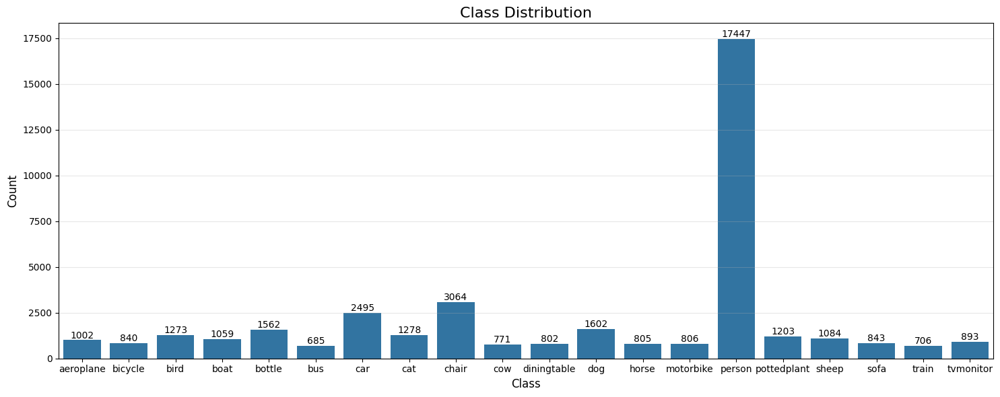

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(15, 6))
ax = sns.countplot(data=df, x='names', order=sorted(df['names'].unique()))
plt.title('Class Distribution', fontsize=16)
plt.xlabel('Class', fontsize=12)
plt.ylabel('Count', fontsize=12)

# Annotate count on top of bars
for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}',
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center',
                xytext=(0, 5), textcoords='offset points')

plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()


  ## Extracting bounding box dimensions from df['boxes'], Filtering out invalid boxes (negative or zero width/height), Plotting histograms for width, height, and area distributions

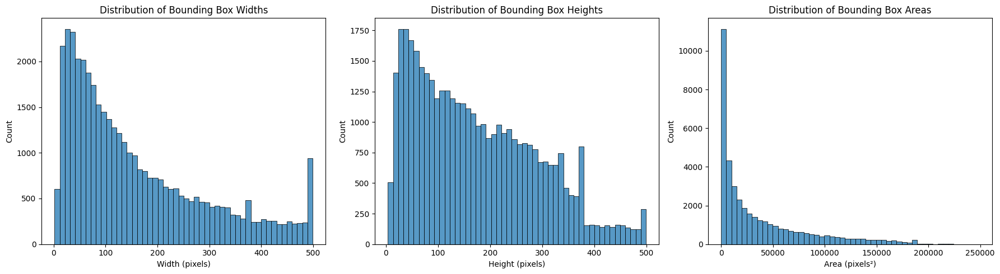

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

widths, heights, areas = [], [], []

# Each entry in df['boxes'] is a single bounding box as a NumPy array
for box in df['boxes']:
    if hasattr(box, '__len__') and len(box) == 4:
        xmin, ymin, xmax, ymax = box
        w = xmax - xmin
        h = ymax - ymin
        a = w * h

        if w > 0 and h > 0:
            widths.append(w)
            heights.append(h)
            areas.append(a)

# Plotting
if widths and heights and areas:
    plt.figure(figsize=(18, 5))

    plt.subplot(1, 3, 1)
    sns.histplot(widths, bins=50)
    plt.title("Distribution of Bounding Box Widths")
    plt.xlabel("Width (pixels)")

    plt.subplot(1, 3, 2)
    sns.histplot(heights, bins=50)
    plt.title("Distribution of Bounding Box Heights")
    plt.xlabel("Height (pixels)")

    plt.subplot(1, 3, 3)
    sns.histplot(areas, bins=50)
    plt.title("Distribution of Bounding Box Areas")
    plt.xlabel("Area (pixels²)")

    plt.tight_layout()
    plt.show()
else:
    print("No valid boxes found.")


In [ ]:
# remove .jpg extension from image_id
df['img_id'] = df['image_id'].apply(lambda x:x.split('.')).map(lambda x:x[0])
df.drop(columns=['image_id'], inplace=True)
df.head()

,names,boxes,xml_path,img_path,img_id
0,aeroplane,"[153, 106, 274, 255]",/content/drive/MyDrive/Colab Notebooks/VOC2012...,/content/drive/MyDrive/Colab Notebooks/VOC2012...,2007_004009
1,sofa,"[2, 191, 363, 375]",/content/drive/MyDrive/Colab Notebooks/VOC2012...,/content/drive/MyDrive/Colab Notebooks/VOC2012...,2007_003530
2,person,"[6, 117, 376, 375]",/content/drive/MyDrive/Colab Notebooks/VOC2012...,/content/drive/MyDrive/Colab Notebooks/VOC2012...,2007_003530
3,boat,"[259, 206, 500, 333]",/content/drive/MyDrive/Colab Notebooks/VOC2012...,/content/drive/MyDrive/Colab Notebooks/VOC2012...,2007_003571
4,person,"[2, 1, 335, 440]",/content/drive/MyDrive/Colab Notebooks/VOC2012...,/content/drive/MyDrive/Colab Notebooks/VOC2012...,2007_004397


In [ ]:
# classes need to be in int form so we use LabelEncoder for this task
enc = preprocessing.LabelEncoder()
df['labels'] = enc.fit_transform(df['names'])
#df['labels'] = np.stack(df['labels'][i]+1 for i in range(len(df['labels'])))
df['labels'] = np.stack([df['labels'][i] + 1 for i in range(len(df['labels']))])


In [ ]:
classes = df[['names','labels']].value_counts()
classes

,,count
names,labels,
person,15,17447
chair,9,3064
car,7,2495
dog,12,1602
bottle,5,1562
cat,8,1278
bird,3,1273
pottedplant,16,1203
sheep,17,1084


In [ ]:
# make dictionary for class objects so we can call objects by their keys.
classes= {1:'aeroplane',2:'bicycle',3:'bird',4:'boat',5:'bottle',6:'bus',7:'car',8:'cat',9:'chair',10:'cow',11:'diningtable',12:'dog',13:'horse',14:'motorbike',15:'person',16:'pottedplant',17:'sheep',18:'sofa',19:'train',20:'tvmonitor'}

In [ ]:

# Convert 'boxes' column (list of [xmin, ymin, xmax, ymax]) into separate columns
df[['xmin', 'ymin', 'xmax', 'ymax']] = pd.DataFrame(df['boxes'].tolist(), index=df.index)

# Drop the original 'boxes' column
df.drop(columns=['boxes'], inplace=True)

# Convert coordinates to float
df[['xmin', 'ymin', 'xmax', 'ymax']] = df[['xmin', 'ymin', 'xmax', 'ymax']].astype(float)


In [ ]:
# drop names column since we dont need it anymore
df.drop(columns=['names'], inplace=True)
df.head()

,xml_path,img_path,img_id,labels,xmin,ymin,xmax,ymax
0,/content/drive/MyDrive/Colab Notebooks/VOC2012...,/content/drive/MyDrive/Colab Notebooks/VOC2012...,2007_004009,1,153.0,106.0,274.0,255.0
1,/content/drive/MyDrive/Colab Notebooks/VOC2012...,/content/drive/MyDrive/Colab Notebooks/VOC2012...,2007_003530,18,2.0,191.0,363.0,375.0
2,/content/drive/MyDrive/Colab Notebooks/VOC2012...,/content/drive/MyDrive/Colab Notebooks/VOC2012...,2007_003530,15,6.0,117.0,376.0,375.0
3,/content/drive/MyDrive/Colab Notebooks/VOC2012...,/content/drive/MyDrive/Colab Notebooks/VOC2012...,2007_003571,4,259.0,206.0,500.0,333.0
4,/content/drive/MyDrive/Colab Notebooks/VOC2012...,/content/drive/MyDrive/Colab Notebooks/VOC2012...,2007_004397,15,2.0,1.0,335.0,440.0


In [ ]:
len(df['img_id'].unique())

17125

## Separate train and validation data

In [ ]:
image_ids = df['img_id'].unique()
valid_ids = image_ids[-4000:]
train_ids = image_ids[:-4000]
len(train_ids)

13125

In [ ]:
valid_df = df[df['img_id'].isin(valid_ids)]
train_df = df[df['img_id'].isin(train_ids)]
valid_df.shape, train_df.shape

((6617, 8), (33603, 8))

## Make dataset by Dataset Module

In [ ]:
class VOCDataset(Dataset):
    def __init__(self, dataframe, image_dir, transforms=None):
        super().__init__()
        if "img_id" not in dataframe.columns:
            raise KeyError("DataFrame must contain 'img_id' column")

        self.image_ids = dataframe['img_id'].unique()
        self.df = dataframe
        self.image_dir = image_dir
        self.transforms = transforms

    def __getitem__(self, index: int):
        image_id = self.image_ids[index]
        records = self.df[self.df['img_id'] == image_id]

        img_path = self.image_dir + '/' + f"{image_id}.jpg" # Explicitly use forward slash
        image = cv2.imread(img_path)
        if image is None:
            raise FileNotFoundError(f"Image not found or corrupted: {img_path}")

        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0
        boxes = records[['xmin', 'ymin', 'xmax', 'ymax']].values

        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        area = torch.as_tensor(area, dtype=torch.float32)
        labels = torch.as_tensor(records['labels'].values, dtype=torch.int64)
        iscrowd = torch.zeros((records.shape[0],), dtype=torch.int64)

        target = {
            'boxes': boxes,
            'labels': labels,
            'image_id': torch.tensor([int(image_id.split('_')[-1])]),
            'area': area,
            'iscrowd': iscrowd
        }

        if self.transforms:
            transformed = self.transforms(
                image=image,
                bboxes=target["boxes"],
                labels=target["labels"].tolist()
            )
            image = transformed["image"]
            target["boxes"] = torch.as_tensor(transformed["bboxes"], dtype=torch.float32)
            target["labels"] = torch.as_tensor(transformed["labels"], dtype=torch.int64)

        return image, target

    def __len__(self) -> int:
        return len(self.image_ids)

In [ ]:
def get_transform_train():
    return A.Compose([
        A.Resize(512, 512),
        A.HorizontalFlip(p=0.5),
        A.RandomBrightnessContrast(p=0.2),
        A.Affine(  # ✅ Fixed instead of ShiftScaleRotate
            scale=(0.9, 1.1),
            translate_percent=(0.02, 0.02),
            rotate=(-10, 10),
            p=0.5
        ),
        ToTensorV2()
    ], bbox_params=A.BboxParams(format='pascal_voc', label_fields=['labels']))

def get_transform_valid():
    return A.Compose([
        A.Resize(512, 512),
        ToTensorV2()
    ], bbox_params=A.BboxParams(format='pascal_voc', label_fields=['labels']))

def collate_fn(batch):
    return tuple(zip(*batch))

df = xml_files_to_df(XML_FILES)
df['img_id'] = df['image_id'].apply(lambda x:x.split('.')).map(lambda x:x[0])
df.drop(columns=['image_id'], inplace=True)
enc = preprocessing.LabelEncoder()
df['labels'] = enc.fit_transform(df['names'])
df['labels'] = np.stack([df['labels'][i] + 1 for i in range(len(df['labels']))])
df[['xmin', 'ymin', 'xmax', 'ymax']] = pd.DataFrame(df['boxes'].tolist(), index=df.index)
df.drop(columns=['boxes'], inplace=True)
df[['xmin', 'ymin', 'xmax', 'ymax']] = df[['xmin', 'ymin', 'xmax', 'ymax']].astype(float)
df.drop(columns=['names'], inplace=True)

image_ids = df['img_id'].unique()
valid_ids = image_ids[-4000:]
train_ids = image_ids[:-4000]
valid_df = df[df['img_id'].isin(valid_ids)]
train_df = df[df['img_id'].isin(train_ids)]


IMG_PATH = "/content/drive/MyDrive/Colab Notebooks/VOC2012/JPEGImages"

train_dataset = VOCDataset(train_df, IMG_PATH , get_transform_train())
valid_dataset = VOCDataset(valid_df, IMG_PATH, get_transform_valid())


# split the dataset in train and test set
indices = torch.randperm(len(train_dataset)).tolist()


train_data_loader = DataLoader(
    train_dataset,
    batch_size=4,
    shuffle=True,
    num_workers=0, # Set num_workers to 0
    collate_fn=collate_fn
)

valid_data_loader = DataLoader(
    valid_dataset,
    batch_size=4,
    shuffle=False,
    num_workers=0, # Set num_workers to 0
    collate_fn=collate_fn
)

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

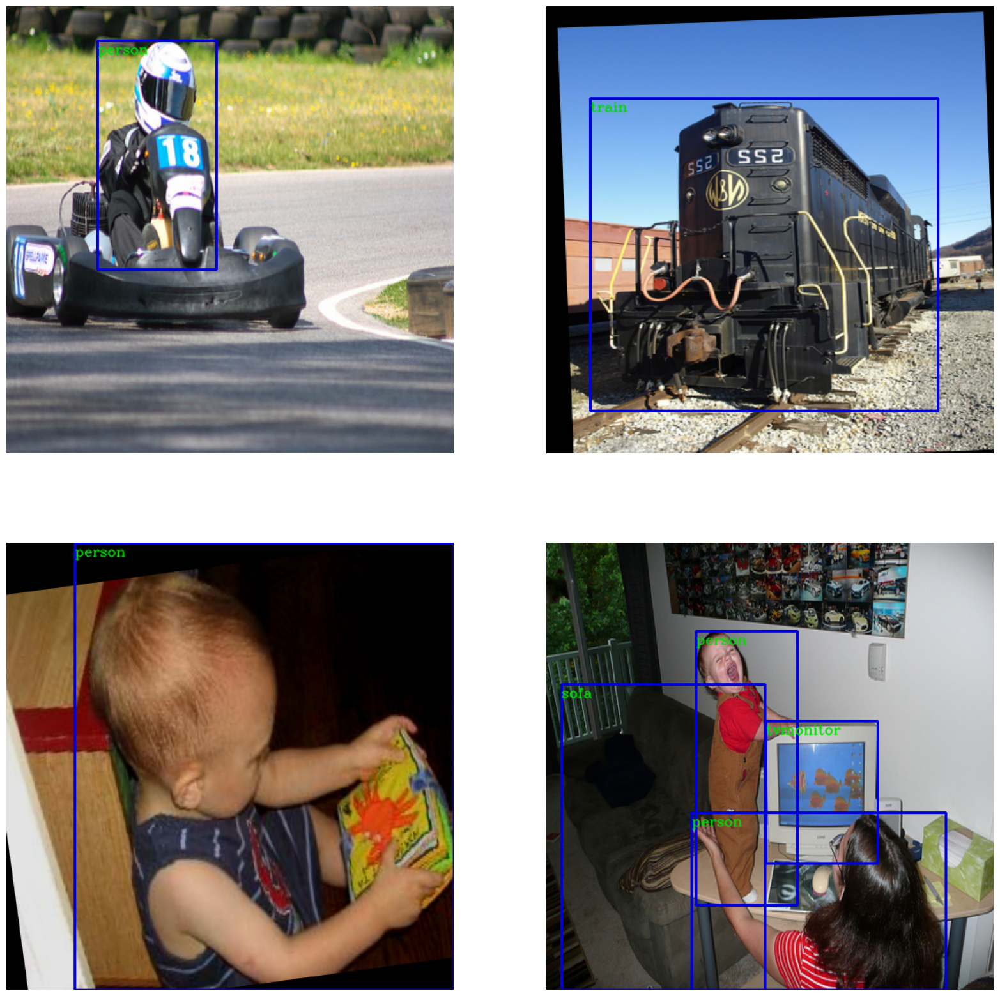

In [ ]:
# make dictionary for class objects so we can call objects by their keys.
classes= {1:'aeroplane',2:'bicycle',3:'bird',4:'boat',5:'bottle',6:'bus',7:'car',8:'cat',9:'chair',10:'cow',11:'diningtable',12:'dog',13:'horse',14:'motorbike',15:'person',16:'pottedplant',17:'sheep',18:'sofa',19:'train',20:'tvmonitor'}

def collate_fn(batch):
    return tuple(zip(*batch))

df = xml_files_to_df(XML_FILES)
df['img_id'] = df['image_id'].apply(lambda x:x.split('.')).map(lambda x:x[0])
df.drop(columns=['image_id'], inplace=True)
enc = preprocessing.LabelEncoder()
df['labels'] = enc.fit_transform(df['names'])
df['labels'] = np.stack([df['labels'][i] + 1 for i in range(len(df['labels']))])
df[['xmin', 'ymin', 'xmax', 'ymax']] = pd.DataFrame(df['boxes'].tolist(), index=df.index)
df.drop(columns=['boxes'], inplace=True)
df[['xmin', 'ymin', 'xmax', 'ymax']] = df[['xmin', 'ymin', 'xmax', 'ymax']].astype(float)
df.drop(columns=['names'], inplace=True)

image_ids = df['img_id'].unique()
valid_ids = image_ids[-4000:]
train_ids = image_ids[:-4000]
valid_df = df[df['img_id'].isin(valid_ids)]
train_df = df[df['img_id'].isin(train_ids)]


IMG_PATH = "/content/drive/MyDrive/Colab Notebooks/VOC2012/JPEGImages"

train_dataset = VOCDataset(train_df, IMG_PATH , get_transform_train())
valid_dataset = VOCDataset(valid_df, IMG_PATH, get_transform_valid())


# split the dataset in train and test set
indices = torch.randperm(len(train_dataset)).tolist()


train_data_loader = DataLoader(
    train_dataset,
    batch_size=4,
    shuffle=True,
    num_workers=0, # Set num_workers to 0
    collate_fn=collate_fn
)

valid_data_loader = DataLoader(
    valid_dataset,
    batch_size=4,
    shuffle=False,
    num_workers=0, # Set num_workers to 0
    collate_fn=collate_fn
)

# Get a batch of data
images, targets = next(iter(train_data_loader))

# Move images and targets to device (if using GPU)
images = list(image.to(device) for image in images)
targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

# Plot
plt.figure(figsize=(20, 20))
for idx, (image, target) in enumerate(zip(images, targets)):
    plt.subplot(2, 2, idx + 1)
    boxes = target['boxes'].cpu().numpy().astype(np.int32)
    # Convert image to uint8 and scale to [0, 255] for correct display
    sample = (image.permute(1, 2, 0).cpu().numpy() * 255).astype(np.uint8)
    names = target['labels'].cpu().numpy().astype(np.int64)

    for j, box in enumerate(boxes):
        cv2.rectangle(sample, (box[0], box[1]), (box[2], box[3]), (0, 0, 220), 2)
        cv2.putText(sample, classes[names[j]], (box[0], box[1] + 15),
                    cv2.FONT_HERSHEY_COMPLEX, 0.5, (0, 220, 0), 1, cv2.LINE_AA)

    plt.axis('off')
    plt.imshow(sample)
plt.show()

In [ ]:
print(df['img_id'].sample(10).tolist())

['2012_004109', '2011_002418', '2008_004378', '2010_003597', '2008_006222', '2011_006512', '2012_003074', '2008_006074', '2010_004263', '2008_007084']


In [ ]:
import os

# Get the path for a sample image from the train_dataset
sample_image_id = train_dataset.image_ids[0]
sample_img_path = train_dataset.image_dir + '/' + f"{sample_image_id}.jpg"

# Check if the file exists
if os.path.exists(sample_img_path):
    print(f"Image file exists: {sample_img_path}")
else:
    print(f"Image file not found: {sample_img_path}")

Image file exists: /content/drive/MyDrive/Colab Notebooks/VOC2012/JPEGImages/2007_004009.jpg


## Download pretrained model

In [ ]:
# load a model; pre-trained on COCO
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:00<00:00, 202MB/s]


In [ ]:
import torchvision
import torch

model = torchvision.models.detection.fasterrcnn_resnet50_fpn(weights="DEFAULT")
num_classes = 21  # 20 VOC classes + background
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(in_features, num_classes)

device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
model.to(device)

params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005, momentum=0.9, weight_decay=0.0005)
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)


In [ ]:
model.to(device)
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005, weight_decay=0.0005)
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.1)

## Download modules for model training

In [ ]:
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'

  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-dhx9r3un
  Running command git clone --filter=blob:none --quiet https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-dhx9r3un
  Resolved https://github.com/cocodataset/cocoapi.git to commit 8c9bcc3cf640524c4c20a9c40e89cb6a2f2fa0e9
  Preparing metadata (setup.py) ... done
  Created wheel for pycocotools: filename=pycocotools-2.0-cp311-cp311-linux_x86_64.whl size=395987 sha256=71e8d58013cffedc8f5145d33728ec416c6055d6af8adebf575ea1a414f52c4d
  Stored in directory: /tmp/pip-ephem-wheel-cache-b1l1difk/wheels/6d/69/75/358c50a37672dfda8d74ba3b30ec49fb75d52f7c081886d503
Successfully built pycocotools
  Attempting uninstall: pycocotools
    Found existing installation: pycocotools 2.0.10
    Uninstalling pycocotools-2.0.10:
      Successfully uninstalled pycocotools-2.0.10


In [ ]:
# ===========================
# 1. INSTALL DEPENDENCIES
# ===========================
!rm -rf vision
!git clone https://github.com/pytorch/vision.git
!cd vision; cp references/detection/utils.py ../; cp references/detection/transforms.py ../; cp references/detection/coco_eval.py ../; cp references/detection/engine.py ../; cp references/detection/coco_utils.py ../

# Fix np.float
with open('coco_eval.py', 'r') as f:
    content = f.read().replace("np.float", "float")
with open('coco_eval.py', 'w') as f:
    f.write(content)


Cloning into 'vision'...
remote: Enumerating objects: 665264, done.
remote: Counting objects: 100% (2178/2178), done.
remote: Compressing objects: 100% (1193/1193), done.
remote: Total 665264 (delta 1845), reused 1060 (delta 976), pack-reused 663086 (from 4)
Receiving objects: 100% (665264/665264), 1.19 GiB | 52.73 MiB/s, done.
Resolving deltas: 100% (622409/622409), done.


In [ ]:
import os
import json
import torch
from torch.utils.data import DataLoader
from torchvision.datasets import CocoDetection
from torchvision import transforms
from pycocotools.coco import COCO
import utils  # from torchvision references

In [ ]:
# ===========================
# 1. PATHS
# ===========================
voc_root = "/content/drive/MyDrive/Colab Notebooks/VOC2012"
voc_annotations = os.path.join(voc_root, "Annotations")
voc_images = os.path.join(voc_root, "JPEGImages")
output_coco_json = os.path.join(voc_root, "annotations_coco.json")


In [ ]:
# ===========================
# 2. READ TRAIN/VAL SPLIT
# ===========================
def read_image_set(file_path):
    with open(file_path) as f:
        return [line.strip() + ".jpg" for line in f.readlines()]

train_split = read_image_set(os.path.join(voc_root, "ImageSets/Main/train.txt"))
val_split = read_image_set(os.path.join(voc_root, "ImageSets/Main/val.txt"))


In [ ]:
# ===========================
# 3. DATASET CLASS
# ===========================
class FilteredCocoDataset(CocoDetection):
    def __init__(self, root, annFile, valid_images, transform=None):
        super().__init__(root=root, annFile=annFile)
        self.valid_images = set(valid_images)
        self.transform = transform

        # Filter dataset by split
        self.ids = [img_id for img_id in self.ids
                    if self.coco.loadImgs(img_id)[0]["file_name"] in self.valid_images]

        # Ensure images exist
        self.ids = [img_id for img_id in self.ids
                    if os.path.exists(os.path.join(root, self.coco.loadImgs(img_id)[0]["file_name"]))]

    def __getitem__(self, index):
        img, target = super().__getitem__(index)

        boxes, labels, areas, iscrowd = [], [], [], []
        for obj in target:
            xmin, ymin, w, h = obj["bbox"]
            boxes.append([xmin, ymin, xmin + w, ymin + h])
            labels.append(obj["category_id"])
            areas.append(obj["area"])
            iscrowd.append(obj.get("iscrowd", 0))

        image_info = self.coco.loadImgs(self.ids[index])[0]
        target = {
            "boxes": torch.tensor(boxes, dtype=torch.float32),
            "labels": torch.tensor(labels, dtype=torch.int64),
            "image_id": torch.tensor([image_info["id"]]),
            "area": torch.tensor(areas, dtype=torch.float32),
            "iscrowd": torch.tensor(iscrowd, dtype=torch.int64),
        }

        if self.transform:
            img = self.transform(img)
        return img, target


In [ ]:
#===========================
# 4. INITIAL DATASETS
# ===========================
transform = transforms.ToTensor()

train_dataset = FilteredCocoDataset(voc_images, output_coco_json, train_split, transform=transform)
val_dataset = FilteredCocoDataset(voc_images, output_coco_json, val_split, transform=transform)

print(f"Initial Dataset Sizes → Train: {len(train_dataset)} | Val: {len(val_dataset)}")



loading annotations into memory...
Done (t=0.87s)
creating index...
index created!
loading annotations into memory...
Done (t=0.35s)
creating index...
index created!
Initial Dataset Sizes → Train: 5727 | Val: 5831


In [ ]:
# ===========================
# 5. CREATE FILTERED JSONs
# ===========================
with open(output_coco_json) as f:
    coco_data = json.load(f)

train_ids = set(train_dataset.ids)
val_ids = set(val_dataset.ids)

def create_filtered_coco(ids_set, output_path):
    filtered_images = [img for img in coco_data["images"] if img["id"] in ids_set]
    filtered_annotations = [ann for ann in coco_data["annotations"] if ann["image_id"] in ids_set]

    filtered_coco = {
        "images": filtered_images,
        "annotations": filtered_annotations,
        "categories": coco_data["categories"]
    }

    with open(output_path, "w") as f:
        json.dump(filtered_coco, f)
    print(f"✅ Saved {output_path} with {len(filtered_images)} images")

train_coco_json = os.path.join(voc_root, "annotations_coco_train.json")
val_coco_json = os.path.join(voc_root, "annotations_coco_val.json")

create_filtered_coco(train_ids, train_coco_json)
create_filtered_coco(val_ids, val_coco_json)


✅ Saved /content/drive/MyDrive/Colab Notebooks/VOC2012/annotations_coco_train.json with 5727 images
✅ Saved /content/drive/MyDrive/Colab Notebooks/VOC2012/annotations_coco_val.json with 5831 images


In [ ]:
# ===========================
# 6. RELOAD DATASETS USING FILTERED JSONs
# ===========================
train_dataset = FilteredCocoDataset(voc_images, train_coco_json, train_split, transform=transform)
val_dataset = FilteredCocoDataset(voc_images, val_coco_json, val_split, transform=transform)

train_loader = DataLoader(train_dataset, batch_size=2, shuffle=True, collate_fn=utils.collate_fn)
val_loader = DataLoader(val_dataset, batch_size=2, shuffle=False, collate_fn=utils.collate_fn)

print(f"Filtered Dataset Sizes → Train: {len(train_dataset)} | Val: {len(val_dataset)}")


loading annotations into memory...
Done (t=0.04s)
creating index...
index created!
loading annotations into memory...
Done (t=0.31s)
creating index...
index created!
Filtered Dataset Sizes → Train: 5727 | Val: 5831


In [ ]:
coco_val = COCO(val_coco_json)

val_ids_dataset = set(val_dataset.ids)  # ✅ Faster: no image loading
val_ids_json = set(coco_val.getImgIds())

print("Val dataset IDs not in COCO JSON:", val_ids_dataset - val_ids_json)
print("Extra COCO IDs not in val dataset:", val_ids_json - val_ids_dataset)


loading annotations into memory...
Done (t=0.04s)
creating index...
index created!
Val dataset IDs not in COCO JSON: set()
Extra COCO IDs not in val dataset: set()


In [ ]:
# ===========================
# 8. READY FOR TRAINING
# ===========================
print("✅ Dataset validation complete. You can now safely start training.")

✅ Dataset validation complete. You can now safely start training.


## safe_evaluate

In [ ]:
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval
import numpy as np

def safe_evaluate(model, data_loader, ann_file, device):
    # ✅ Patch for np.float (NumPy 1.24+)
    if not hasattr(np, 'float'):
        np.float = float

    coco = COCO(ann_file)
    img_ids = set(coco.getImgIds())

    results = []
    model.eval()
    for images, targets in data_loader:
        images = [img.to(device) for img in images]
        outputs = model(images)

        for target, output in zip(targets, outputs):
            image_id = target["image_id"].item()
            if image_id not in img_ids:
                continue  # Skip invalid IDs

            for box, label, score in zip(output["boxes"], output["labels"], output["scores"]):
                results.append({
                    "image_id": image_id,
                    "category_id": label.item(),
                    "bbox": [box[0].item(), box[1].item(), box[2].item() - box[0].item(), box[3].item() - box[1].item()],
                    "score": score.item()
                })

    if not results:
        print("⚠ No valid predictions for evaluation.")
        return

    coco_results = coco.loadRes(results)
    coco_eval = COCOeval(coco, coco_results, "bbox")
    coco_eval.evaluate()
    coco_eval.accumulate()
    coco_eval.summarize()


In [ ]:
!git clone https://github.com/pytorch/vision.git
!cd vision;cp references/detection/utils.py ../;cp references/detection/transforms.py ../;cp references/detection/coco_eval.py ../;cp references/detection/engine.py ../;cp references/detection/coco_utils.py ../

fatal: destination path 'vision' already exists and is not an empty directory.


## debug before training

In [ ]:
import os

print("Annotations JSON:", output_coco_json, "✅" if os.path.exists(output_coco_json) else "❌")
print("Images Folder:", voc_images, "✅" if os.path.exists(voc_images) else "❌")


Annotations JSON: /content/drive/MyDrive/Colab Notebooks/VOC2012/annotations_coco.json ✅
Images Folder: /content/drive/MyDrive/Colab Notebooks/VOC2012/JPEGImages ✅


In [ ]:
print(f"Train split: {len(train_split)}")
print(f"Val split: {len(val_split)}")

Train split: 5717
Val split: 5823


In [ ]:
# ===========================
# 4. VERIFY DATASET
# ===========================
img, target = train_dataset[0]
print("Image shape:", img.shape)
print("Target keys:", target.keys())
print("Image ID:", target["image_id"])
print("Boxes:", target["boxes"])

Image shape: torch.Size([3, 375, 500])
Target keys: dict_keys(['boxes', 'labels', 'image_id', 'area', 'iscrowd'])
Image ID: tensor([313])
Boxes: tensor([[  1., 114., 485., 274.]])


In [ ]:
batch = next(iter(train_loader))
print("Batch images:", len(batch[0]))
print("Batch targets:", len(batch[1]))


Batch images: 2
Batch targets: 2


In [ ]:
model.eval()
safe_evaluate(model, val_loader, val_coco_json, device)


loading annotations into memory...
Done (t=0.05s)
creating index...
index created!
Loading and preparing results...
DONE (t=2.34s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=12.74s).
Accumulating evaluation results...
DONE (t=7.36s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.001
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.006
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDet

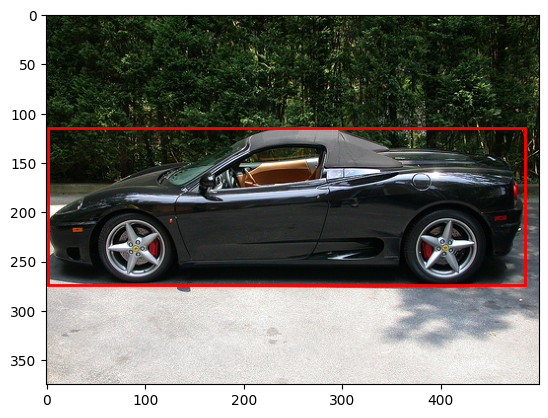

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

img, target = train_dataset[0]
plt.imshow(img.permute(1, 2, 0))

for box in target["boxes"]:
    xmin, ymin, xmax, ymax = box
    rect = patches.Rectangle((xmin, ymin), xmax-xmin, ymax-ymin,
                             linewidth=2, edgecolor='r', facecolor='none')
    plt.gca().add_patch(rect)

plt.show()


## after successful debugging we have started pre-trained model

## Train object detection model

In [ ]:
from engine import train_one_epoch, evaluate
import utils
import torch

In [ ]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
model.to(device)

num_epochs = 10  # or more for better results
for epoch in range(num_epochs):
    print(f"\n🔵 Starting Epoch {epoch+1}/{num_epochs}")

    # Training
    train_one_epoch(model, optimizer, train_loader, device, epoch, print_freq=10)

    # Update learning rate
    lr_scheduler.step()

    # Evaluation after each epoch
    print("🟢 Evaluating...")
    safe_evaluate(model, val_loader, val_coco_json, device)



🔵 Starting Epoch 1/10


/content/engine.py:30: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=scaler is not None):


Epoch: [0]  [   0/2864]  eta: 1:22:59  lr: 0.000010  loss: 3.4540 (3.4540)  loss_classifier: 3.2226 (3.2226)  loss_box_reg: 0.2123 (0.2123)  loss_objectness: 0.0127 (0.0127)  loss_rpn_box_reg: 0.0063 (0.0063)  time: 1.7387  data: 0.6104  max mem: 6518
Epoch: [0]  [  10/2864]  eta: 0:58:44  lr: 0.000060  loss: 3.5045 (3.5845)  loss_classifier: 3.2226 (3.2223)  loss_box_reg: 0.2892 (0.3277)  loss_objectness: 0.0188 (0.0184)  loss_rpn_box_reg: 0.0106 (0.0161)  time: 1.2351  data: 0.5835  max mem: 6518
Epoch: [0]  [  20/2864]  eta: 0:57:07  lr: 0.000110  loss: 3.5206 (3.5555)  loss_classifier: 3.1544 (3.1583)  loss_box_reg: 0.3840 (0.3648)  loss_objectness: 0.0121 (0.0153)  loss_rpn_box_reg: 0.0106 (0.0171)  time: 1.1785  data: 0.5855  max mem: 6518
Epoch: [0]  [  30/2864]  eta: 0:55:19  lr: 0.000160  loss: 3.2899 (3.4316)  loss_classifier: 2.9698 (3.0515)  loss_box_reg: 0.3468 (0.3470)  loss_objectness: 0.0079 (0.0158)  loss_rpn_box_reg: 0.0068 (0.0173)  time: 1.1363  data: 0.5457  max me

##  Full Model Loading

In [ ]:
from torchvision.models.detection import FasterRCNN

torch.serialization.add_safe_globals([FasterRCNN])
model = torch.load("faster_rcnn_model.pth", weights_only=False)
model.to(device)
model.eval()


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
       

## Load Weights Only

In [ ]:
# load  a model; pre-trained on COCO
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=False, pretrained_backbone=False)

WEIGHTS_FILE = "./faster_rcnn_state.pth"

num_classes = 21

# get number of input features for the classifier
in_features = model.roi_heads.box_predictor.cls_score.in_features

# replace the pre-trained head with a new one
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

# Load the traines weights
model.load_state_dict(torch.load(WEIGHTS_FILE))

model = model.to(device)

## matrix

[WARNING] Missing image for annotation: 2008_006410(1).xml
[WARNING] Missing image for annotation: 2008_006416(1).xml
[WARNING] Missing image for annotation: 2008_006417(1).xml
[WARNING] Missing image for annotation: 2008_006419(1).xml
[WARNING] Missing image for annotation: 2008_006421(1).xml
[WARNING] Missing image for annotation: 2008_006424(1).xml
[WARNING] Missing image for annotation: 2008_006425(1).xml
[WARNING] Missing image for annotation: 2008_006427(1).xml
[WARNING] Missing image for annotation: 2008_006429(1).xml
[WARNING] Missing image for annotation: 2008_006430(1).xml
[WARNING] Missing image for annotation: 2011_001201(1).xml
[WARNING] Missing image for annotation: 2011_001203(1).xml
[WARNING] Missing image for annotation: 2011_001206(1).xml
[WARNING] Missing image for annotation: 2011_001208(1).xml
[WARNING] Missing image for annotation: 2011_001210(1).xml
[WARNING] Missing image for annotation: 2011_001211(1).xml
[WARNING] Missing image for annotation: 2011_001213(1).x

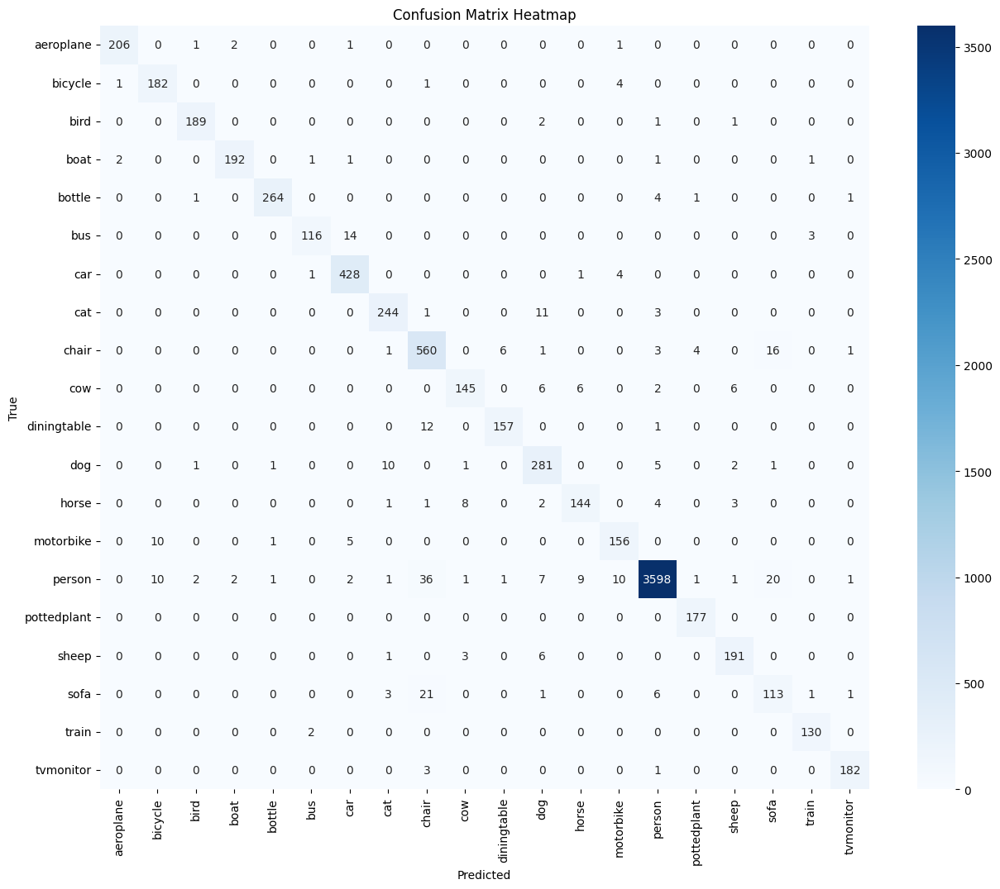


Classification Report:
              precision    recall  f1-score   support

   aeroplane       0.99      0.98      0.98       211
     bicycle       0.90      0.97      0.93       188
        bird       0.97      0.98      0.98       193
        boat       0.98      0.97      0.97       198
      bottle       0.99      0.97      0.98       271
         bus       0.97      0.87      0.92       133
         car       0.95      0.99      0.97       434
         cat       0.93      0.94      0.94       259
       chair       0.88      0.95      0.91       592
         cow       0.92      0.88      0.90       165
 diningtable       0.96      0.92      0.94       170
         dog       0.89      0.93      0.91       302
       horse       0.90      0.88      0.89       163
   motorbike       0.89      0.91      0.90       172
      person       0.99      0.97      0.98      3703
 pottedplant       0.97      1.00      0.98       177
       sheep       0.94      0.95      0.94       201
   

In [ ]:
import os
import torch
from torch.utils.data import Dataset, DataLoader, random_split
from PIL import Image
import xml.etree.ElementTree as ET
import torchvision.transforms as T
from torchvision.ops import box_iou
from torchmetrics.detection.mean_ap import MeanAveragePrecision
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

# ============================
# CLASS MAPPING
# ============================
classes = {
    1: 'aeroplane', 2: 'bicycle', 3: 'bird', 4: 'boat', 5: 'bottle',
    6: 'bus', 7: 'car', 8: 'cat', 9: 'chair', 10: 'cow',
    11: 'diningtable', 12: 'dog', 13: 'horse', 14: 'motorbike', 15: 'person',
    16: 'pottedplant', 17: 'sheep', 18: 'sofa', 19: 'train', 20: 'tvmonitor'
}
label_map = {v: k for k, v in classes.items()}

# ============================
# DATASET CLASS
# ============================
class VOCDataset(Dataset):
    def __init__(self, ann_dir, img_dir, transforms=None):
        self.ann_dir = ann_dir
        self.img_dir = img_dir
        self.transforms = transforms

        self.ann_files = []
        self.img_files = []

        # Filter out annotations with missing images
        for f in sorted(os.listdir(ann_dir)):
            if f.endswith(".xml"):
                img_file = f.replace(".xml", ".jpg")
                img_path = os.path.join(img_dir, img_file)
                if os.path.exists(img_path):
                    self.ann_files.append(f)
                    self.img_files.append(img_file)
                else:
                    print(f"[WARNING] Missing image for annotation: {f}")

    def __len__(self):
        return len(self.ann_files)

    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.img_files[idx])
        ann_path = os.path.join(self.ann_dir, self.ann_files[idx])

        image = Image.open(img_path).convert("RGB")
        boxes, labels = self.parse_voc_xml(ann_path)

        target = {
            "boxes": torch.tensor(boxes, dtype=torch.float32),
            "labels": torch.tensor(labels, dtype=torch.int64),
            "image_id": torch.tensor([idx])
        }

        if self.transforms:
            image = self.transforms(image)

        return image, target

    def parse_voc_xml(self, xml_path):
        tree = ET.parse(xml_path)
        root = tree.getroot()
        boxes, labels = [], []
        for obj in root.findall("object"):
            label_name = obj.find("name").text.lower()
            if label_name not in label_map:
                continue
            labels.append(label_map[label_name])
            bndbox = obj.find("bndbox")
            xmin = float(bndbox.find("xmin").text)
            ymin = float(bndbox.find("ymin").text)
            xmax = float(bndbox.find("xmax").text)
            ymax = float(bndbox.find("ymax").text)
            boxes.append([xmin, ymin, xmax, ymax])
        return boxes, labels


# ============================
# TRANSFORMS
# ============================
def get_transform(train):
    transforms = [T.ToTensor()]
    if train:
        transforms.append(T.RandomHorizontalFlip(0.5))
    return T.Compose(transforms)

# ============================
# EVALUATION FUNCTION
# ============================
def evaluate_model(model, data_loader, device, classes, iou_threshold=0.5, score_threshold=0.5):
    model.eval()
    metric = MeanAveragePrecision(iou_thresholds=[iou_threshold])
    all_preds, all_labels = [], []

    with torch.no_grad():
        for images, targets in data_loader:
            # Move images and targets to device
            images = [img.to(device) for img in images]
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

            outputs = model(images)
            metric.update(outputs, targets)  # Now both outputs and targets are on GPU

            for target, output in zip(targets, outputs):
                gt_boxes, gt_labels = target["boxes"].cpu(), target["labels"].cpu()
                pred_boxes, pred_scores, pred_labels = output["boxes"].cpu(), output["scores"].cpu(), output["labels"].cpu()

                keep = pred_scores >= score_threshold
                pred_boxes, pred_labels = pred_boxes[keep], pred_labels[keep]

                if len(gt_boxes) > 0 and len(pred_boxes) > 0:
                    ious = box_iou(pred_boxes, gt_boxes)
                    matched_gt = ious.max(dim=1).indices
                    matched_ious = ious.max(dim=1).values
                    for pred_idx, gt_idx in enumerate(matched_gt):
                        if matched_ious[pred_idx] >= iou_threshold:
                            all_preds.append(pred_labels[pred_idx].item())
                            all_labels.append(gt_labels[gt_idx].item())

    # Confusion Matrix
    cm = confusion_matrix(all_labels, all_preds, labels=list(classes.keys()))
    plt.figure(figsize=(15, 12))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=[classes[i] for i in classes],
                yticklabels=[classes[i] for i in classes])
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title("Confusion Matrix Heatmap")
    plt.show()

    print("\nClassification Report:")
    print(classification_report(all_labels, all_preds, target_names=[classes[i] for i in classes]))

    return metric.compute()

# ============================
# DATASET & DATALOADER
# ============================
BASE_PATH = "/content/drive/MyDrive/Colab Notebooks/VOC2012"
IMG_PATH = f"{BASE_PATH}/JPEGImages"
ANN_PATH = f"{BASE_PATH}/Annotations"

dataset = VOCDataset(ANN_PATH, IMG_PATH, transforms=get_transform(train=False))
val_size = int(0.2 * len(dataset))
train_size = len(dataset) - val_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

data_loader_train = DataLoader(train_dataset, batch_size=4, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))
data_loader_test = DataLoader(val_dataset, batch_size=4, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))

# ============================
# EVALUATE MODEL
# ============================
results = evaluate_model(model, data_loader_test, device, classes)

print("\n📊 mAP Results:")
for k, v in results.items():
    print(f"{k}: {v}")


## visualize_predictions

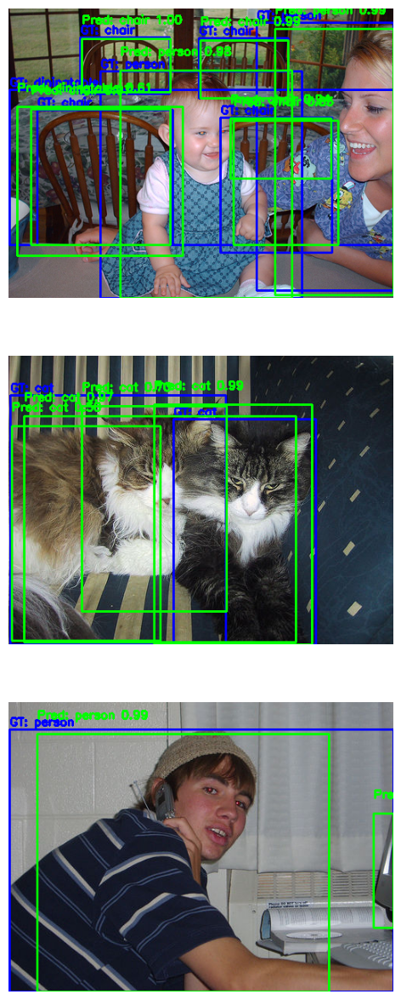

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def visualize_predictions(model, dataset, device, num_images=5, score_threshold=0.5):
    model.eval()
    plt.figure(figsize=(15, num_images * 5))

    for idx in range(num_images):
        image, target = dataset[idx]
        img_tensor = image.to(device).unsqueeze(0)

        output = model(img_tensor)[0]
        output = {k: v.cpu() for k, v in output.items()}

        # Convert to numpy and uint8
        img_np = (image.permute(1, 2, 0).numpy() * 255).astype(np.uint8)
        img_bgr = cv2.cvtColor(img_np, cv2.COLOR_RGB2BGR)  # OpenCV uses BGR

        # Draw ground truth in BLUE
        for box, label in zip(target["boxes"], target["labels"]):
            box = box.int().numpy()
            cv2.rectangle(img_bgr, (box[0], box[1]), (box[2], box[3]), (255, 0, 0), 2)
            cv2.putText(img_bgr, f"GT: {classes[label.item()]}", (box[0], box[1]-5),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

        # Draw predictions in GREEN
        for box, label, score in zip(output["boxes"], output["labels"], output["scores"]):
            if score >= score_threshold:
                box = box.int().numpy()
                cv2.rectangle(img_bgr, (box[0], box[1]), (box[2], box[3]), (0, 255, 0), 2)
                cv2.putText(img_bgr, f"Pred: {classes[label.item()]} {score:.2f}",
                            (box[0], box[1]-20), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

        # Convert BGR back to RGB for matplotlib
        img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

        plt.subplot(num_images, 1, idx + 1)
        plt.imshow(img_rgb)
        plt.axis("off")

    plt.show()

# Example:
visualize_predictions(model, val_dataset, device, num_images=3)


## image predictions

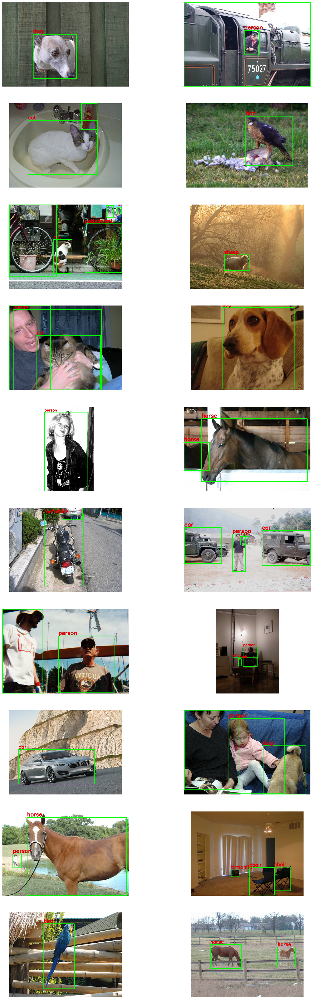

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import torch

def obj_detector(img_path, model, device, detection_threshold=0.7):
    # Read image and preprocess
    img = cv2.imread(img_path, cv2.IMREAD_COLOR)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0

    img_tensor = torch.from_numpy(img_rgb).permute(2, 0, 1).unsqueeze(0).to(device)

    model.eval()
    with torch.no_grad():
        outputs = model(img_tensor)

    # Extract outputs
    output = outputs[0]
    boxes = output['boxes'].cpu().numpy()
    labels = output['labels'].cpu().numpy()
    scores = output['scores'].cpu().numpy()

    # Filter by detection threshold
    keep = scores >= detection_threshold
    boxes = boxes[keep].astype(np.int32)
    labels = labels[keep]

    # Return original RGB image for drawing
    return labels, boxes, img_rgb

# ========================
# Run detection on images
# ========================
pred_path = "/content/drive/MyDrive/Colab Notebooks/VOC2012/JPEGImages"
pred_files = [os.path.join(pred_path, f) for f in os.listdir(pred_path) if f.endswith(".jpg")]

plt.figure(figsize=(20, 60))
for idx, img_file in enumerate(pred_files[:20]):  # Display first 20 images
    plt.subplot(10, 2, idx + 1)
    names, boxes, sample = obj_detector(img_file, model, device)

    # Draw bounding boxes
    sample_copy = (sample * 255).astype(np.uint8)  # Convert back to uint8 for OpenCV
    for j, box in enumerate(boxes):
        cv2.rectangle(sample_copy, (box[0], box[1]), (box[2], box[3]), (0, 255, 0), 2)
        cv2.putText(sample_copy, classes[names[j]], (box[0], box[1] - 5),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.7, (220, 0, 0), 2)

    plt.axis("off")
    plt.imshow(sample_copy)

plt.show()


## dataset

## https://www.kaggle.com/datasets/huanghanchina/pascal-voc-2012/code